In [1]:
import pandas as pd
from bs4 import BeautifulSoup
from urllib.request import urlopen, Request
import time, datetime
import matplotlib.pyplot as plt
import re, math
import numpy as np

from web_commons import extract_table_by_class, flatten_df, extract_compound_tables
from web_commons import fetch_scrip_data, extract_scrip_ratios, get_screener_data
from commons import read_xls, get_stock_data, NSE_BSE, save_csv, get_holding_quantities
from consts import CONSOLIDATED_NOT_AVAILABLE_ON_SCREENER, OUT_DIR

In [2]:
# OLD_CSV_DUMP = 'screener_dump_20240104214359.csv'
# OLD_CSV_DUMP = 'screener_dump_20240120055349.csv' ### TODO: pick last file automatically?
# OLD_CSV_DUMP = 'screener_dump_20240124064253.csv' ### removing spurious Nov2023 FII/DII data!!
# OLD_CSV_DUMP = 'screener_dump_20240130042728.csv'
# OLD_CSV_DUMP = 'screener_dump_20240216214621.csv'
# OLD_CSV_DUMP = 'screener_dump_20240304165155.csv'
# OLD_CSV_DUMP = 'screener_dump_20240425000321.csv'
# OLD_CSV_DUMP = 'screener_dump_20240821212502.csv'
# OLD_CSV_DUMP = 'screener_dump_20241205091919.csv'
OLD_CSV_DUMP = 'screener_dump_20250301225929.csv'


# FLAT_ATTRIBUTES = ['Market Cap', 'Stock P/E', 'Dividend Yield', 'ROCE', 'ROE', 'Face Value', 'ROIC', \
#                    'Debt to equity', 'Pledged percentage', 'PEG Ratio']
FLAT_ATTRIBUTES = ['Market Cap', 'Current Price', 'High / Low', 'Stock P/E',\
                   'Book Value', 'Dividend Yield', 'ROCE', 'ROE', 'Face Value']

ATTRIBUTE_THRESHOLDS = {
                            'Stock P/E': 35,
                            'ROCE'     : 30,
                            'ROE'      : 25,
                            'ROIC'     : 30,
}

ATTRIBUTES = [
                'Return on Equity',  #'^ROE', # Just a flat number not time series
#               '\[ROE\]', # Just for BAJFINANCE
                'Compounded Profit Growth', 
                'Compounded Sales Growth', 
                'Stock Price CAGR',
                '\[NetProfit\]\[[JFMASOND]', 
                '\[NetProfit\]\[Qtr]', 
                '\[Sales\]\[[JFMASOND]', 
                '\[Sales\]\[Qtr]', 
                '\[EPSinRs\]\[[JFMASOND]', 
                '\[EPSinRs\]\[Qtr]',
                '\[Promoters\]\[[JFMASOND]',
                '\[FIIs\]\[[JFMASOND]',
                '\[DIIs\]\[[JFMASOND]',
                '\[Public\]\[[JFMASOND]'
]

df = pd.DataFrame()

In [3]:
def sort_cols(cols): 
    if re.findall("\[[JFMASOND][a-z]+[0-9]+\]", cols[0]):
        good_cols = []
        for c in cols:
            # print(c)
            try:
                datetime.datetime.strptime(c.rsplit('[', 1)[-1].replace(']', ''), '%b%Y')
                good_cols.append(c)
            except:
                print('BAD COLUMN ENCOUNTERED, removing from column list: ', c)
        
        good_cols.sort(key=lambda x: datetime.datetime.strptime(x.rsplit('[', 1)[-1].replace(']', ''), '%b%Y'))
        return good_cols
        
    return cols

def rename_col_names(df, cols, series=False):
#     col_name_maps = {c:c.replace(re.findall(g, c)[0], '').replace('[', '').replace(']', '') for c in cols}
    col_name_maps = {c:c.rsplit('[', 1)[-1].replace(']', '') for c in cols}
    df = df[cols]
    
    if series:
        df = df.rename(col_name_maps)
    else:
        df = df.rename(columns=col_name_maps)

    return df

def get_plot_dim(attributes):
    l = len(attributes)
    r = math.ceil(math.sqrt(l))+1
    c = math.ceil(l/r)
    
    return r, c

def get_title_from_attributes(attr):
    name = attr.split(']', 1)[0].replace('\\', '').replace('[', '') 
    if 'Qtr' in attr:
        name += 'Qtr'
    
    return name

def plot_attribute_per_scrip(df, png_folder_name='fundamental_data/', save_pngs=False):
    for attr in ATTRIBUTES:
        cols = [c for c in df.columns if re.findall(attr, c)]
        cols = sort_cols(cols)
        attr_df = rename_col_names(df, cols).T[get_holding_quantities().keys()].fillna(value=0) #method='ffill')

        f = attr_df.plot(subplots=True, layout=(8, 3), figsize=(35, 20), grid=True, sharex=True, kind='bar')
        
        for ax in plt.gcf().axes:
            if attr == 'Return on Equity':
                ax.plot(attr_df.index.values.tolist(), [.2]*len(attr_df.index.values), c='g', linewidth=4)
            ax.tick_params(axis='x', which='both', labelsize=20, labelrotation=35)
            ax.tick_params(axis='y', which='both', labelsize=20)
            ax.legend([ax.get_title()], fontsize = 21, loc='upper left') #loc=1

        ax = f[0][0]
        fig = ax.get_figure()
        fig.tight_layout()
        fig.subplots_adjust(top=0.95, hspace=.3, wspace=.08)
        fig.suptitle(get_title_from_attributes(attr), fontsize=25)
        fig.patch.set_linewidth(10)
        fig.patch.set_edgecolor('cornflowerblue')
        
        for ax in plt.gcf().axes:
            plt.sca(ax)
            plt.xticks(rotation = 45, ha='right')
        
        if save_pngs:
            fig.savefig(f'{OUT_DIR}{png_folder_name}{get_title_from_attributes(attr)}.png') #, edgecolor=fig.get_edgecolor())
            print(f'Wrote: {OUT_DIR}{png_folder_name}{get_title_from_attributes(attr)}.png')

def plot_scrips_with_attributes(df, png_folder_name='fundamental_data/', save_pngs=False):
    for scrip in get_holding_quantities():
        nrows, ncols = get_plot_dim(ATTRIBUTES)
        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(35, 20))
        fig.suptitle(scrip, fontsize=30)
        fig.tight_layout()
        fig.subplots_adjust(top=0.92, hspace=.3, wspace=.08)
        fig.patch.set_linewidth(10)
        fig.patch.set_edgecolor('cornflowerblue')

        df_c = df.loc[scrip]
        g_num = 0
        for i in range(nrows):
            for j in range(ncols):
                if g_num == len(ATTRIBUTES):
                    break

                attr = ATTRIBUTES[g_num] #'Return on Equity'
                cols = [c for c in df_c.keys() if re.findall(attr, c)]
                cols = sort_cols(cols)
                df1 = rename_col_names(df_c, cols, series=True)
                df1 = df1.fillna(value=0) #method='ffill') #df1.dropna()
                axes[i][j].tick_params(axis='x', which='both', labelsize=12)
                axes[i][j].tick_params(axis='y', which='both', labelsize=15)
                
                
                df1.plot(ax=axes[i][j], title=get_title_from_attributes(attr), grid=True, kind='bar')
                axes[i][j].title.set_size(23)
                
                if attr == 'Return on Equity':
                    axes[i][j].plot(df1.index.values.tolist(), [.2]*len(df1.index.values), c='g', linewidth=4)
                    
                g_num += 1

        for ax in plt.gcf().axes:
            plt.sca(ax)
            plt.xticks(rotation = 35, ha='right') 
            
        if save_pngs:
            fig.savefig(f'{OUT_DIR}{png_folder_name}{scrip}.png', bbox_inches='tight') #, edgecolor=fig.get_edgecolor())
            print(f'Wrote: {OUT_DIR}{png_folder_name}{scrip}.png')

def write_pngs_to_html(png_folder_name='fundamental_data/'):
    png_names = ['flat_attribs']
    png_names += [get_title_from_attributes(g) for g in ATTRIBUTES]
    png_names += [s for s in get_holding_quantities()]

    
    html = "<!DOCTYPE html>\n"
    html += "<HTML>\n"
    html += "<BODY>\n"
    for p in png_names:
        html += '\t<img src="{}.png">\n'.format(p)
        html += '<BR>'
    html += "</BODY>"
    html += "</HTML>"

    with open(f"{OUT_DIR}{png_folder_name}index.html", "w") as html_file:
        html_file.write(html)
        print(f"Wrote: {OUT_DIR}{png_folder_name}index.html")

def add_data_from_prev_csv(curr_df, csv_name, index_col='Scrip'):
    df_prev = pd.read_csv(csv_name, index_col=index_col)
    old_not_in_new = list(set([c for c in df_prev.columns]) - set([c for c in curr_df.columns]))
    print(f'Adding old columns not in new data: {old_not_in_new}')
    
    for c in old_not_in_new:
        curr_df[c] = df_prev[c]
        
    return curr_df

def plot_flat_data(df, attributes, png_folder_name='fundamental_data/', save_pngs=True):
#     nrows, ncols = get_plot_dim(attributes)
    nrows = 2
    ncols = int(len(FLAT_ATTRIBUTES)/(nrows))
    nrows, ncols = 3, 3 ### TODO: HACK HACK HACK!!!
    attr_matrix = np.array(FLAT_ATTRIBUTES).reshape((nrows, ncols))
        
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(35, 20))
    fig.suptitle('Flat Attributes', fontsize=30)
    fig.tight_layout()
    fig.subplots_adjust(top=0.92, hspace=.3, wspace=.08)
    fig.patch.set_linewidth(10)
    fig.patch.set_edgecolor('cornflowerblue')
    
    for i in range(nrows):
        for j in range(ncols):
            attr = attr_matrix[i][j] #'Stock P/E'
            
            if attr not in df.columns.values:
                print(f'****** MISSING: {attr} ********!!!')
                continue
    
            df1 = df[attr].sort_values(ascending=False).T 
            df1 = df1.fillna(value=0) #method='ffill') #df1.dropna()
            axes[i][j].tick_params(axis='x', labelsize=12, labelbottom=True)
            axes[i][j].tick_params(axis='y', which='both', labelsize=15)
                
            df1.plot(ax=axes[i][j], title=attr, grid=True, kind='bar', \
                             color=[f'C{i}' for i in range(df[attr].size)])
            axes[i][j].title.set_size(23)

            if attr in ATTRIBUTE_THRESHOLDS:
                axes[i][j].plot(df1.index.values.tolist(), [ATTRIBUTE_THRESHOLDS[attr]]*len(df1.index.values), c='g', linewidth=3)

    for ax in axes.flatten():
        plt.sca(ax)
        plt.xticks(rotation = 45, ha='right')

    if save_pngs:
        fig.savefig(f'{OUT_DIR}{png_folder_name}flat_attribs.png', bbox_inches='tight')
        print(f'Wrote: {OUT_DIR}{png_folder_name}flat_attribs.png')


********** BAJFINANCE
********** KPITTECH
********** SONACOMS
********** AFFLE
********** FINEORG
********** DEEPAKNTR
********** DMART
********** DIVISLAB
********** NAUKRI
********** IONEXCHANG
********** HAPPSTMNDS
********** LAURUSLABS
********** TATACHEM
********** BERGEPAINT
********** PRAJIND
********** RAJRATAN
********** PRINCEPIPE
********** DEVYANI
********** GARFIBRES
********** RBA
Adding old columns not in new data: ['[Depreciation][Qtr][Jun2020]', '[OperatingProfit][Qtr][Mar2019]', '[NetNPA][Qtr][Mar2021]', '[DIIs][Mar2022]', '[NetProfit][Qtr][Dec2019]', '[Government][Jun2021]', '[Profitbeforetax][Qtr][Sep2021]', '[Depreciation][Qtr][Sep2019]', '[Promoters][Dec2020]', '[OperatingProfit][Qtr][Dec2021]', '[Others][Mar2022]', '[Sales][Qtr][Sep2019]', '[Interest][Qtr][Dec2019]', '[Depreciation][Qtr][Jun2019]', '[Depreciation][Mar2012]', '[NoofShareholders][Dec2021]', '[InventoryDays][Mar2013]', '[InventoryDays][Mar2012]', '[GrossNPA][Qtr][Mar2022]', '[Sales][Mar2012]', '[Net

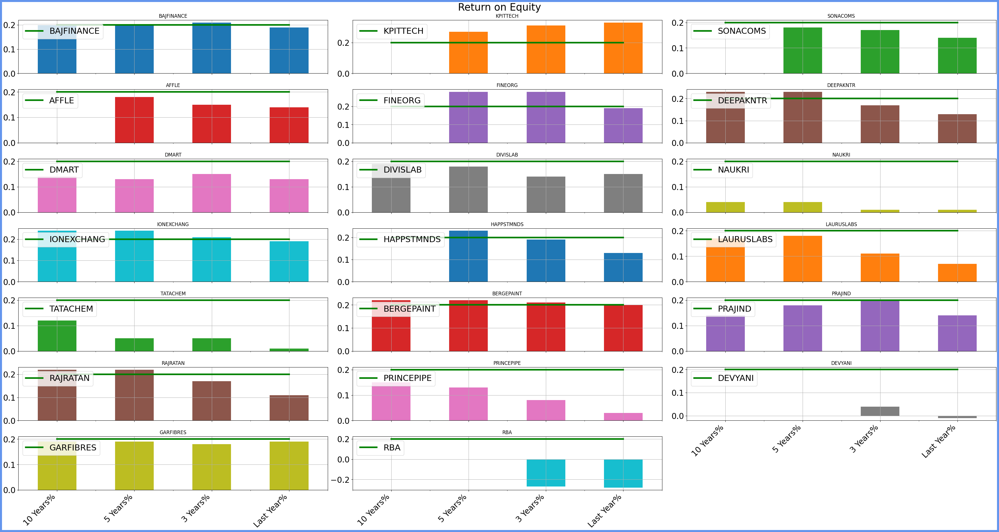

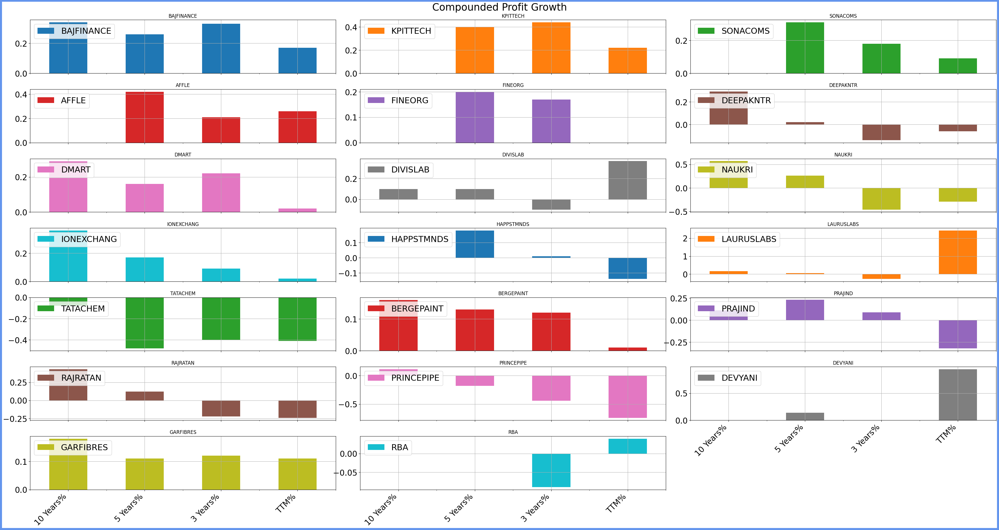

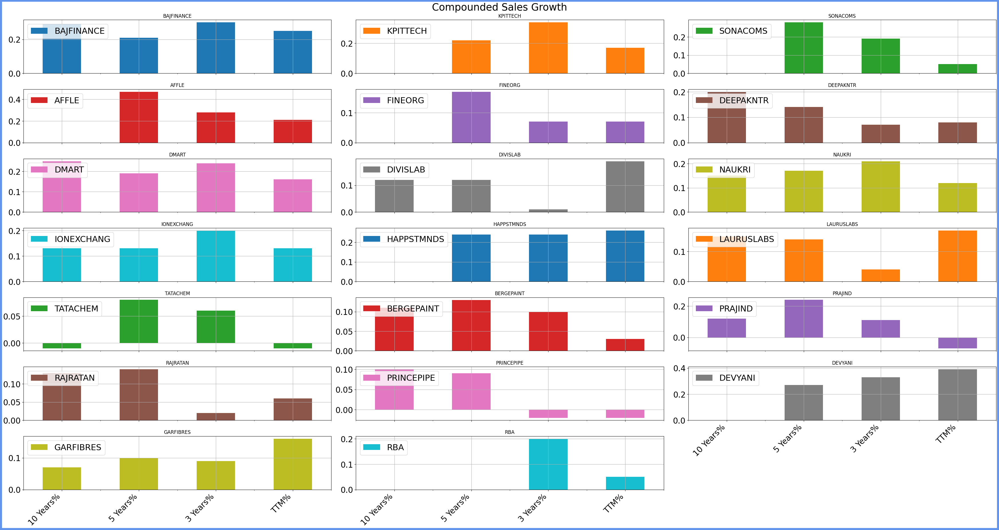

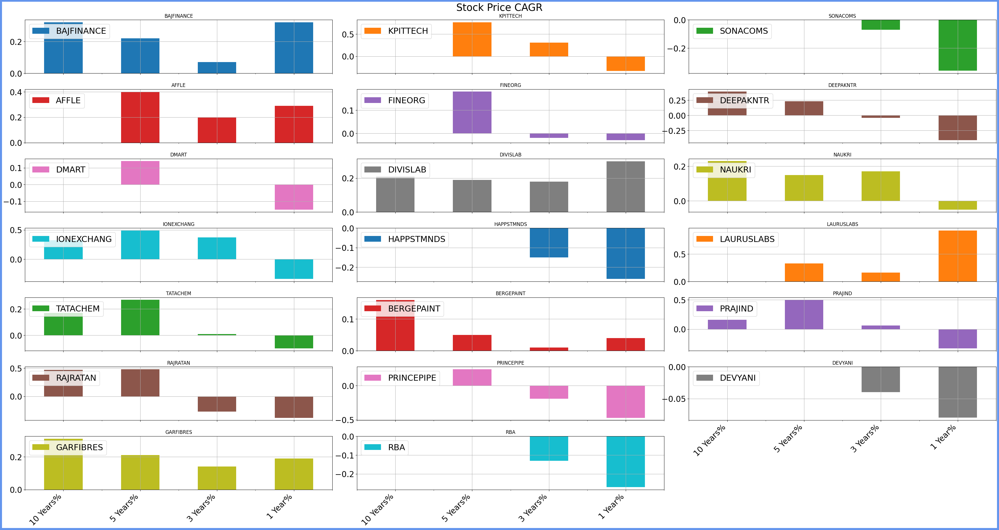

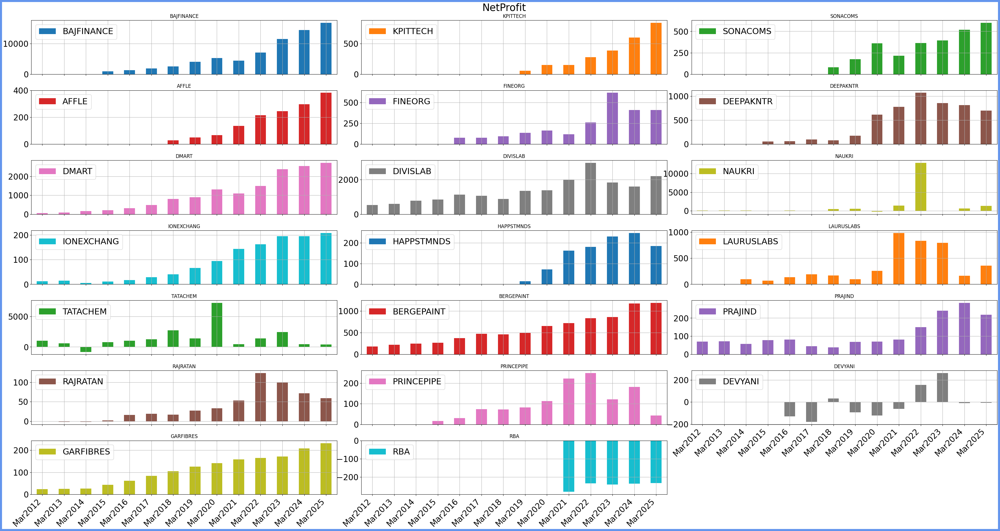

...

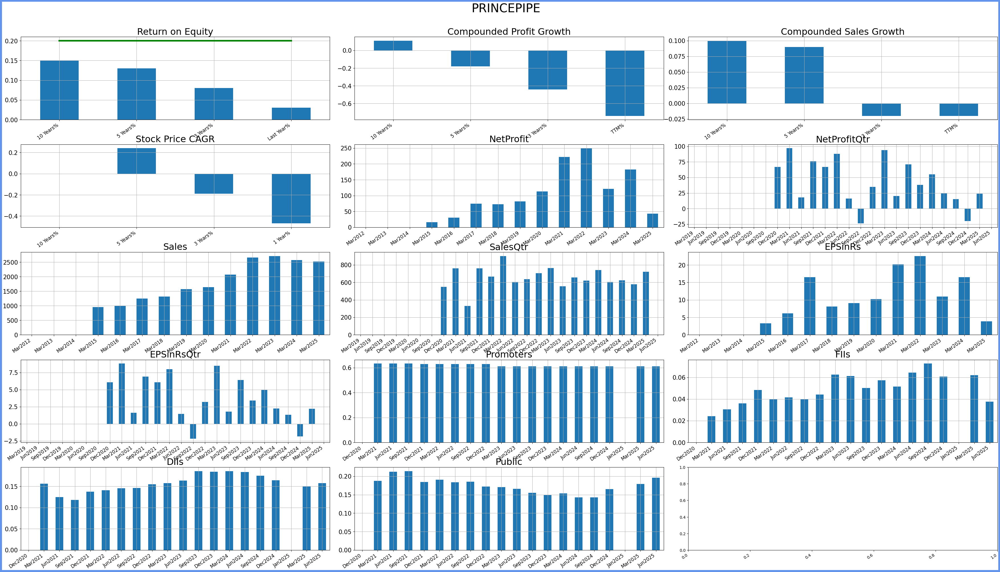

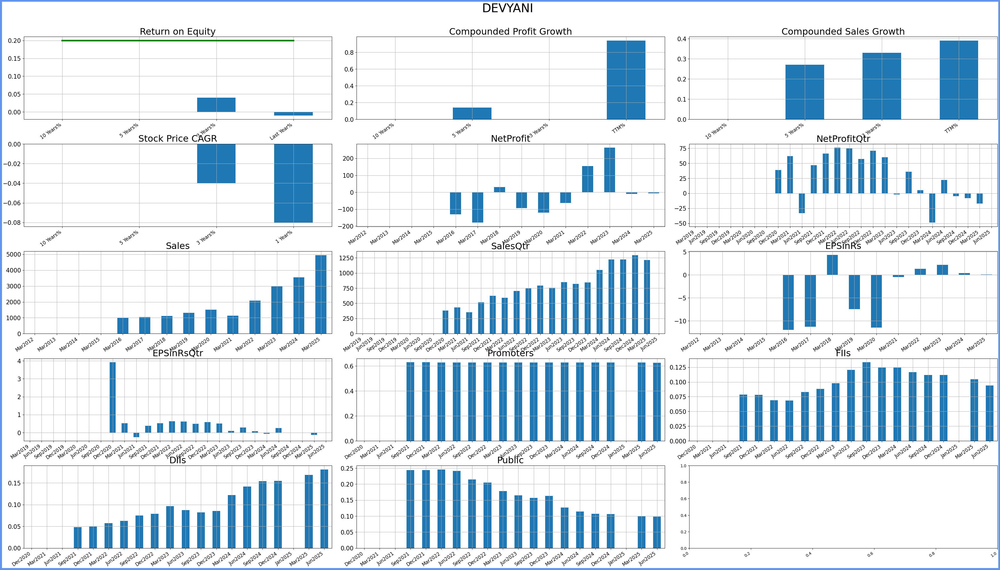

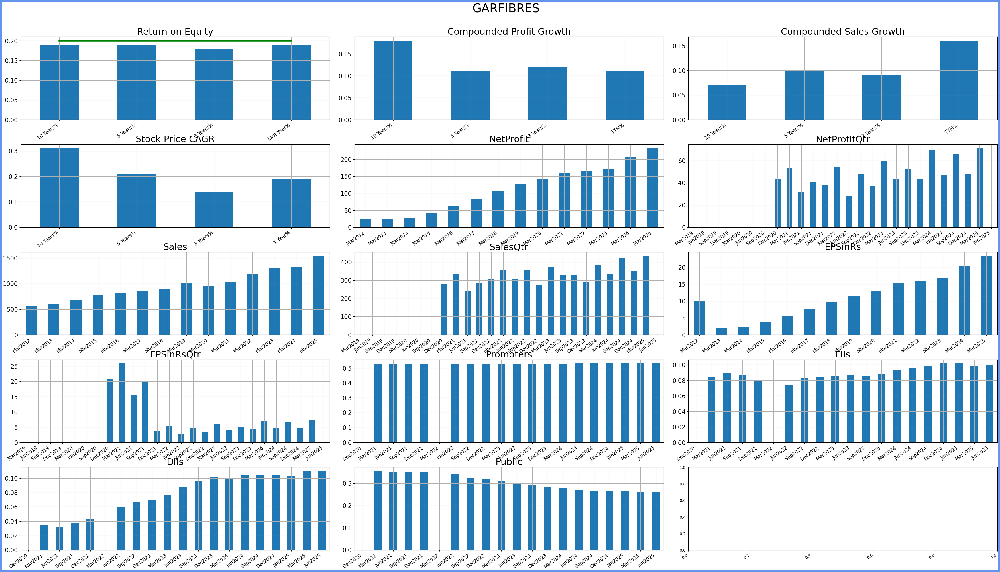

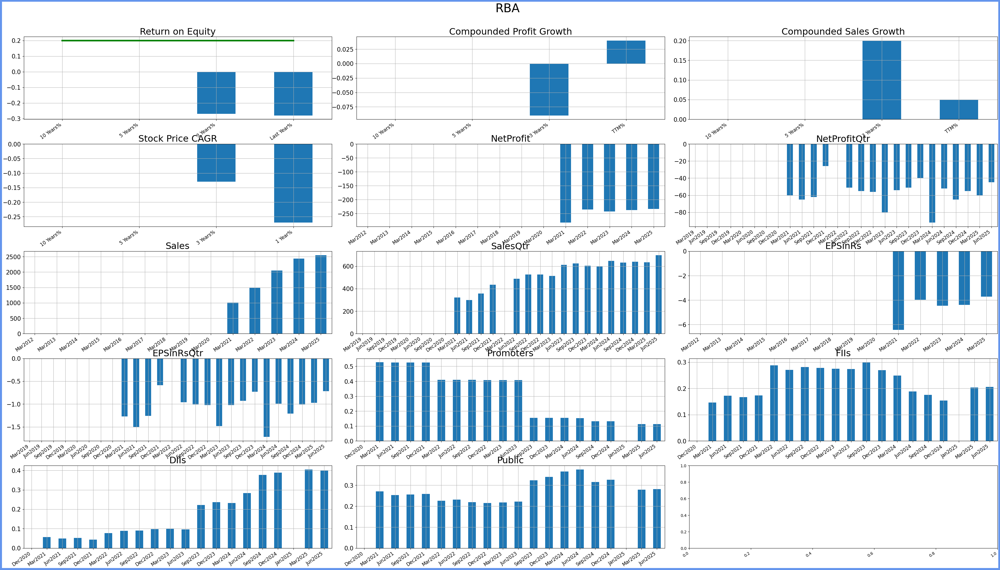

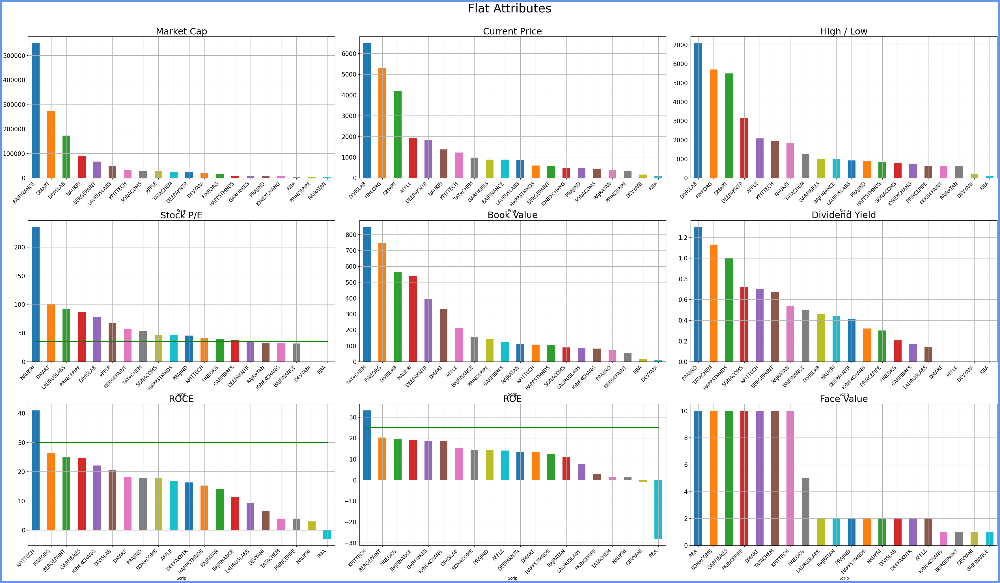

In [4]:
if df.empty:
    df = get_screener_data()
else:
    print('df already loaded, using from cache!')

### TODO - add only old cols, not the updated ones like Nov2023 FII/DII data!
df = add_data_from_prev_csv(df, f'{OUT_DIR}{OLD_CSV_DUMP}') 

save_csv(df, 'screener_dump')

plot_attribute_per_scrip(df.copy(), save_pngs=True)
plot_scrips_with_attributes(df.copy(), save_pngs=True)
plot_flat_data(df.copy(), FLAT_ATTRIBUTES, save_pngs=True)
write_pngs_to_html()

In [6]:
df.columns.values

array(['Market Cap', 'Current Price', 'High / Low', 'Stock P/E',
       'Book Value', 'Dividend Yield', 'ROCE', 'ROE', 'Face Value',
       '[Sales][Mar2015]', '[Sales][Mar2016]', '[Sales][Mar2017]',
       '[Sales][Mar2018]', '[Sales][Mar2019]', '[Sales][Mar2020]',
       '[Sales][Mar2021]', '[Sales][Mar2022]', '[Sales][Mar2023]',
       '[Sales][Mar2024]', '[Sales][TTM]', '[Interest][Mar2015]',
       '[Interest][Mar2016]', '[Interest][Mar2017]',
       '[Interest][Mar2018]', '[Interest][Mar2019]',
       '[Interest][Mar2020]', '[Interest][Mar2021]',
       '[Interest][Mar2022]', '[Interest][Mar2023]',
       '[Interest][Mar2024]', '[Interest][TTM]', '[Expenses][Mar2015]',
       '[Expenses][Mar2016]', '[Expenses][Mar2017]',
       '[Expenses][Mar2018]', '[Expenses][Mar2019]',
       '[Expenses][Mar2020]', '[Expenses][Mar2021]',
       '[Expenses][Mar2022]', '[Expenses][Mar2023]',
       '[Expenses][Mar2024]', '[Expenses][TTM]',
       '[OperatingProfit][Mar2015]', '[OperatingProfit]

In [7]:
from bs4 import BeautifulSoup
from urllib.request import urlopen, Request
import pandas as pd

CONSOLIDATED_NOT_AVAILABLE_ON_SCREENER = ['PRINCEPIPE', 'RELAXO']


SCREENER_TOP_DATA = ['Market Cap', 'Current Price', 'High / Low', 'Stock P/E', 'Book Value',
                     'Dividend Yield', 'ROCE', 'ROE', 'Face Value', 'ROIC', 'PEG Ratio',
                     'Debt to equity', 'Financial leverage', 'EVEBITDA', 'Pledged percentage',
                     'CMP / FCF']

def fetch_number_span(list_element):
    num_span = list_element.find('span',{'class':'number'})

    num_span = num_span.text.replace(',', '')
    return float(num_span) if (num_span != '') else 0.0
    
def extract_scrip_ratios(soup,div_class, ul_id):
    div_html = soup.find('div',{'class': div_class})
    ul_html = div_html.find('ul',{'id': ul_id})
     
    scrip_data = pd.Series()
    for d in SCREENER_TOP_DATA:
        print(d)
        for li in ul_html.find_all("li"):
            name_span = li.find('span',{'class':'name'})
            
            if d in name_span.text: 
                scrip_data[d] = fetch_number_span(li)

    return scrip_data

# df['ROIC']
scrip = 'BERGEPAINT'
print(f'********** {scrip}')
URL = f'https://www.screener.in/company/{scrip}/'

if scrip not in CONSOLIDATED_NOT_AVAILABLE_ON_SCREENER:
    URL += 'consolidated/'

hdr = {'User-Agent':'Mozilla/5.0'}
req = Request(URL, headers=hdr)
page=urlopen(req)
soup = BeautifulSoup(page)
data = {'Scrip': scrip} 
data.update(extract_scrip_ratios(soup,'company-ratios', 'top-ratios'))
data

********** BERGEPAINT
Market Cap
Current Price
High / Low
Stock P/E
Book Value
Dividend Yield
ROCE
ROE
Face Value
ROIC
PEG Ratio
Debt to equity
Financial leverage
EVEBITDA
Pledged percentage
CMP / FCF


{'Scrip': 'BERGEPAINT',
 'Market Cap': np.float64(55894.0),
 'Current Price': np.float64(479.0),
 'High / Low': np.float64(630.0),
 'Stock P/E': np.float64(48.8),
 'Book Value': np.float64(48.0),
 'Dividend Yield': np.float64(0.73),
 'ROCE': np.float64(27.5),
 'ROE': np.float64(23.5),
 'Face Value': np.float64(1.0)}

In [8]:
attr = '\[FIIs\]\[[JFMASOND]'
cols = [c for c in df.columns if re.findall(attr, c)]
cols = sort_cols(cols)

print(df[cols])
attr_df = rename_col_names(df, cols).T[['BAJFINANCE', 'DMART', 'DEEPAKNTR', 'SONACOMS']].fillna(method='ffill')
attr_df

# f = attr_df.plot(subplots=True, layout=(2,2), figsize=(35,20), grid=True, sharex=False)
# # attr_df.loc[:, :] = .25
# # f = f.plot(subplots=True, layout=(2,2), figsize=(35,20), grid=True, sharex=False)
# # plt.tight_layout()

# for ax in plt.gcf().axes:
#     ax.legend(fontsize = 25, loc='upper right') #loc=1
# #     print(dir(ax))
# #     print(ax.get_xticks())
# #     ax.set_ylabel('crapppp')
#     ax.plot(attr_df.index.values.tolist(), [.2]*len(attr_df.index.values), c='g', linewidth=4)
#     ax.tick_params(axis='x', which='both', labelsize=20)
#     ax.tick_params(axis='y', which='both', labelsize=20)


# #     plt.xticks(fontsize = 15)
    

# # for i in range(2):
# #     for j in range(2):
# #         f[i][j].plot([])
# #         df1.plot(ax=axes[i][j], title=get_title_from_attributes(attr), grid=True)



# ax = f[0][0]
# fig = ax.get_figure()
# fig.tight_layout()
# fig.subplots_adjust(top=0.95)

# fig.suptitle(get_title_from_attributes(attr), fontsize=20)
# fig.patch.set_linewidth(10)
# fig.patch.set_edgecolor('cornflowerblue')

# f

            [FIIs][Dec2020]  [FIIs][Mar2021]  [FIIs][Jun2021]  \
Scrip                                                           
BAJFINANCE              NaN           0.2406           0.2403   
SONACOMS                NaN              NaN           0.1389   
KPITTECH                NaN           0.2092           0.1982   
DMART                   NaN           0.1017           0.1004   
AFFLE                   NaN           0.1728           0.1825   
DEEPAKNTR               NaN           0.1187           0.1143   
NAUKRI                  NaN           0.3933           0.3774   
FINEORG              0.0638           0.0593           0.0680   
DIVISLAB                NaN           0.1987           0.2060   
HAPPSTMNDS              NaN           0.0707           0.0623   
IONEXCHANG              NaN           0.0085           0.0149   
TATACHEM                NaN           0.1403           0.1302   
BERGEPAINT              NaN           0.1124           0.1125   
PRAJIND                 N

Scrip,BAJFINANCE,DMART,DEEPAKNTR,SONACOMS
Dec2020,NaN,NaN,NaN,NaN
Mar2021,0.2406,0.1017,0.1187,NaN
Jun2021,0.2403,0.1004,0.1143,0.1389
Sep2021,0.2364,0.0995,0.1085,0.1038
Dec2021,0.2285,0.0944,0.0884,0.0977
Mar2022,0.2141,0.0883,0.0876,0.0879
Jun2022,0.1998,0.0859,0.0907,0.0880
Sep2022,0.2049,0.0872,0.0845,0.1156
Dec2022,0.1987,0.0863,0.0872,0.1127
Mar2023,0.1916,0.0817,0.0772,0.2469


In [9]:
# attr_df = rename_col_names(df, cols).T[['BAJFINANCE', 'DMART', 'DEEPAKNTR', 'SONACOMS']].fillna(method='ffill')
# print(attr_df.columns)
# attr_df.loc[:, :] = .25
# attr_df.index.values.tolist()

Dec2020       NaN
Mar2021    0.0826
Jun2021    0.0826
Sep2021    0.0829
Dec2021    0.0883
Mar2022    0.0942
Jun2022    0.0952
Sep2022    0.0923
Dec2022    0.0924
Mar2023    0.0937
Jun2023    0.0949
Sep2023    0.0941
Dec2023    0.0887
Mar2024    0.0850
Jun2024    0.0809
Sep2024    0.0791
Name: DMART, dtype: float64


<Axes: title={'center': 'FIIs'}>

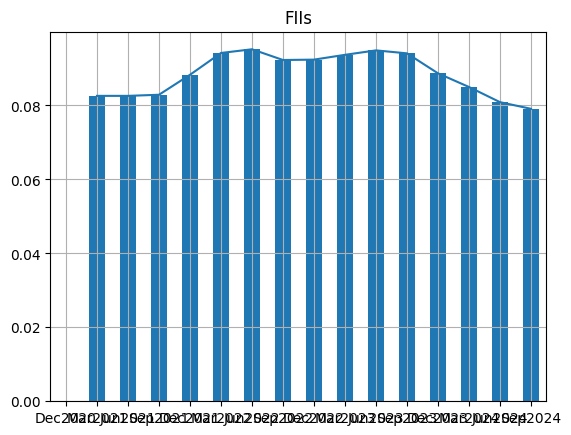

In [10]:
attr = '\[FIIs\]\[[JFMASOND]'
# # for scrip, q in get_holding_quantities():
# #     print(scrip, q)
# # get_holding_quantities()
df_c = df.loc['DMART']
cols = [c for c in df_c.keys() if re.findall('\[Public\]\[[JFMASOND]', c)]
cols = sort_cols(cols)

# print(cols)
df1 = rename_col_names(df_c, cols, series=True)
# df1=df1.dropna()
df1 = df1.fillna(method='ffill')
print(df1)
df1.plot(title=get_title_from_attributes(attr), grid=True, kind='bar')
df1.plot(title=get_title_from_attributes(attr), grid=True)





In [11]:
# save_csv(df, 'screener_dump')

In [12]:
df.drop('BAJFINANCE')
df.drop('NAUKRI')


df

,Market Cap,Current Price,High / Low,Stock P/E,Book Value,Dividend Yield,ROCE,ROE,Face Value,[Sales][Mar2015],...,[CashConversionCycle][Mar2012],[NoofShareholders][Mar2021],[ROCE][Mar2012],[NetProfit][Qtr][Sep2020],[Expenses][Qtr][Sep2020],[Tax][Qtr][Jun2019],[Interest][Qtr][Jun2019],[OperatingProfit][Qtr][Jun2019],[Sales][Qtr][Jun2019],[Public][Sep2021]
Scrip,,,,,,,,,,,,,,,,,,,,,
BAJFINANCE,419367.0,6775.0,7830.0,27.3,1402.00,0.53,11.90,22.10,2.0,5392.0,...,NaN,464394.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1042
SONACOMS,43065.0,693.0,769.0,75.0,84.20,0.44,24.00,20.90,10.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0588
KPITTECH,40266.0,1469.0,1929.0,55.5,91.20,0.46,38.40,31.20,10.0,NaN,...,NaN,75567.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.2472
DMART,251238.0,3861.0,5485.0,93.5,309.00,0.00,19.40,14.50,10.0,6439.0,...,26.0,306995.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0829
AFFLE,25233.0,1798.0,1815.0,73.6,192.00,0.00,16.20,15.00,2.0,NaN,...,NaN,88416.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.1757
DEEPAKNTR,36907.0,2706.0,3169.0,46.5,373.00,0.28,21.60,16.40,2.0,1327.0,...,NaN,190915.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3285
NAUKRI,109814.0,8474.0,8556.0,227.0,3225.00,0.26,3.65,2.44,10.0,732.0,...,8.0,136025.0,0.32,NaN,NaN,NaN,NaN,NaN,NaN,0.1011
FINEORG,15775.0,5145.0,5959.0,35.9,691.00,0.19,31.30,23.80,5.0,NaN,...,NaN,42044.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0689
DIVISLAB,164683.0,6204.0,6449.0,89.7,517.00,0.48,16.50,12.20,2.0,3115.0,...,341.0,208203.0,0.34,NaN,NaN,NaN,NaN,NaN,NaN,0.1100


In [13]:
cols = ['[NetProfit][Qtr][Sep2020]', '[NetProfit][Qtr][Dec2020]', '[NetProfit][Qtr][Mar2021]', 
        '[NetProfit][Qtr][Jun2021]', '[NetProfit][Qtr][Sep2021]', '[NetProfit][Qtr][Dec2021]', 
        '[NetProfit][Qtr][Mar2022]', '[NetProfit][Qtr][Jun2022]', '[NetProfit][Qtr][Sep2022]', 
        '[NetProfit][Qtr][Dec2022]', '[NetProfit][Qtr][Mar2023]', '[NetProfit][Qtr][Jun2023]', 
        '[NetProfit][Qtr][Sep2023]', '[NetProfit][Qtr][Mar2019]', '[NetProfit][Qtr][Jun2019]', 
        '[NetProfit][Qtr][Sep2019]', '[NetProfit][Qtr][Dec2019]', '[NetProfit][Qtr][Mar2020]', 
        '[NetProfit][Qtr][Jun2020]']

# my_strings.sort(key=lambda date: datetime.strptime(date, '%d.%m.%y time %H.%M'))
d = cols[0].rsplit('[', 1)[-1].replace(']', '')
print(d)
datetime.datetime.strptime(d, '%b%Y')
cols.sort(key=lambda x: datetime.datetime.strptime(x.rsplit('[', 1)[-1].replace(']', ''), '%b%Y'))
cols




Sep2020


['[NetProfit][Qtr][Mar2019]',
 '[NetProfit][Qtr][Jun2019]',
 '[NetProfit][Qtr][Sep2019]',
 '[NetProfit][Qtr][Dec2019]',
 '[NetProfit][Qtr][Mar2020]',
 '[NetProfit][Qtr][Jun2020]',
 '[NetProfit][Qtr][Sep2020]',
 '[NetProfit][Qtr][Dec2020]',
 '[NetProfit][Qtr][Mar2021]',
 '[NetProfit][Qtr][Jun2021]',
 '[NetProfit][Qtr][Sep2021]',
 '[NetProfit][Qtr][Dec2021]',
 '[NetProfit][Qtr][Mar2022]',
 '[NetProfit][Qtr][Jun2022]',
 '[NetProfit][Qtr][Sep2022]',
 '[NetProfit][Qtr][Dec2022]',
 '[NetProfit][Qtr][Mar2023]',
 '[NetProfit][Qtr][Jun2023]',
 '[NetProfit][Qtr][Sep2023]']

In [14]:
g = '\[NetProfit\]\[Qtr]'
c = '[NetProfit][Qtr][Mar2019]'
# g = '\[Sales\]\[[JFMASOND]'
c = '[Sales][Mar2012]'
c = '[Return on Equity][10 Years]%'
# c.replace(re.findall(g, c)[0], '').replace('[', '').replace(']', '')
c.rsplit('[', 1)[-1].replace(']', '')
g.split(']', 1)[0].replace('\\', '').replace('[', '')

g.split(']', 1)[0].replace('\\', '').replace('[', '') 

'NetProfit'

BAD COLUMN ENCOUNTERED, removing from column list:  [NetProfit][Mar20183m]
BAD COLUMN ENCOUNTERED, removing from column list:  [Sales][Mar20183m]
BAD COLUMN ENCOUNTERED, removing from column list:  [EPSinRs][Mar20183m]


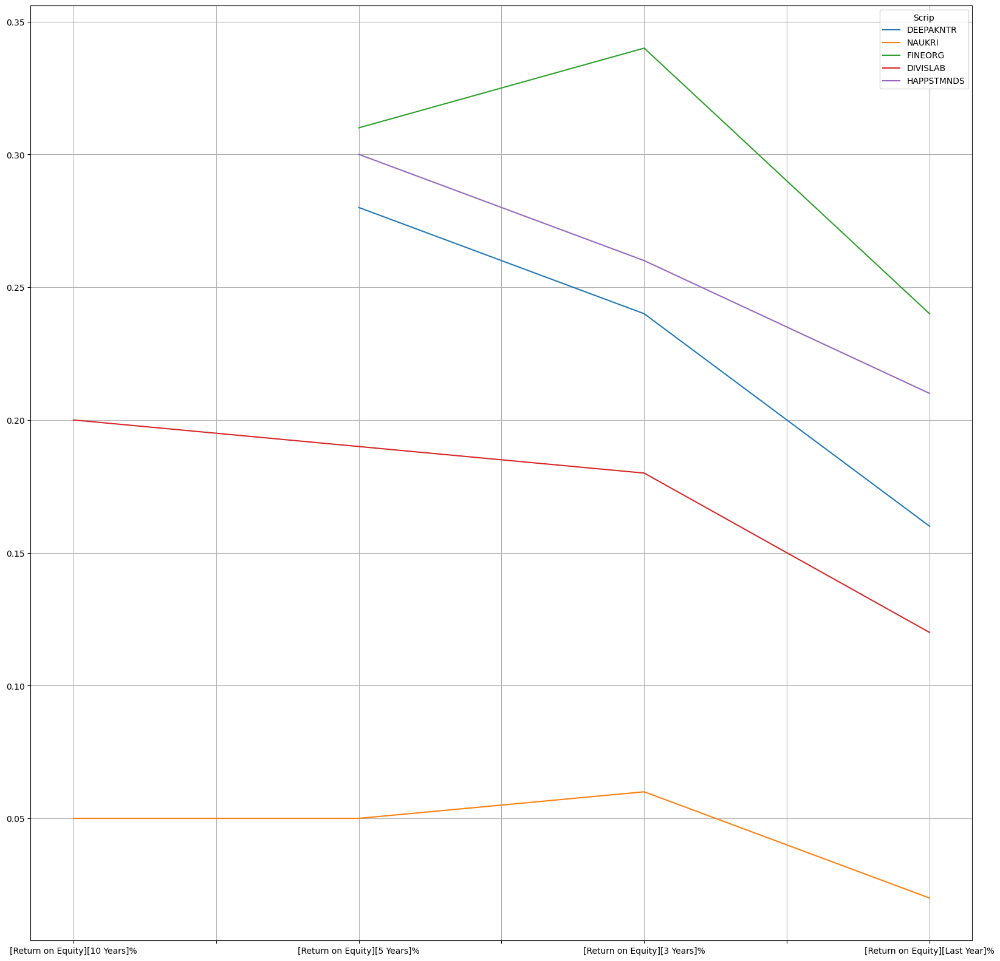

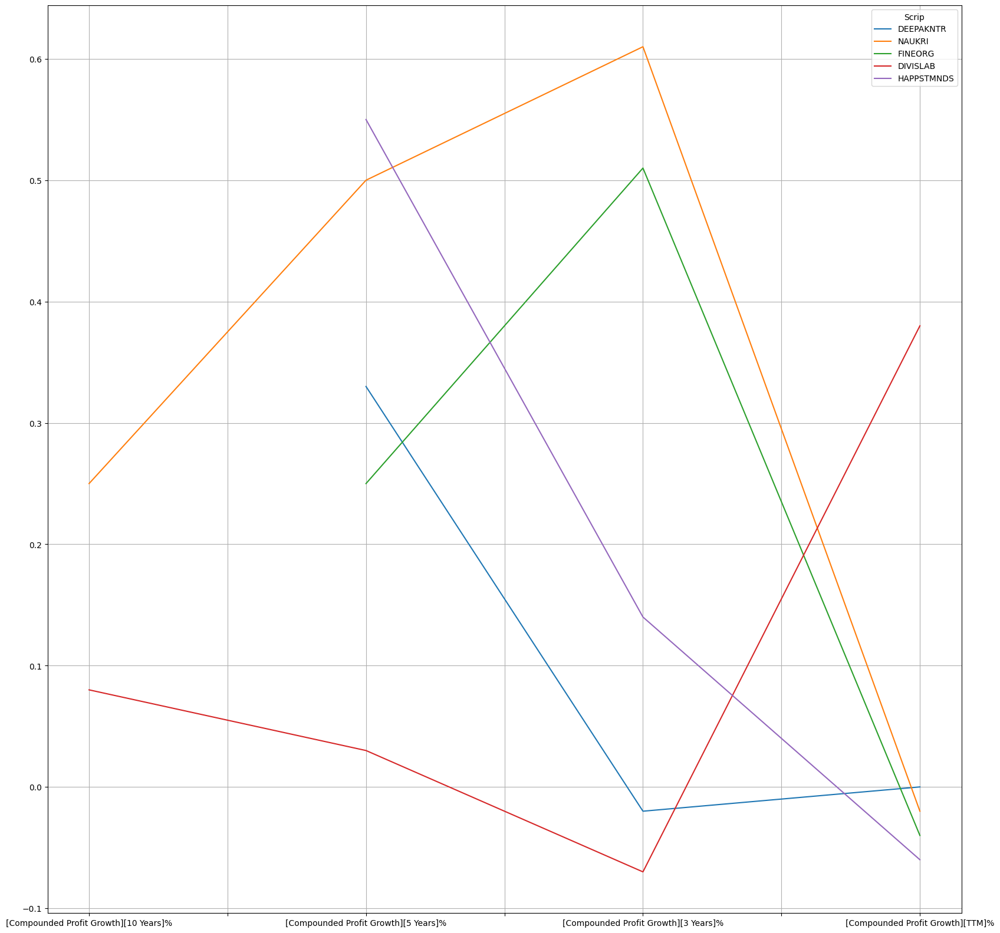

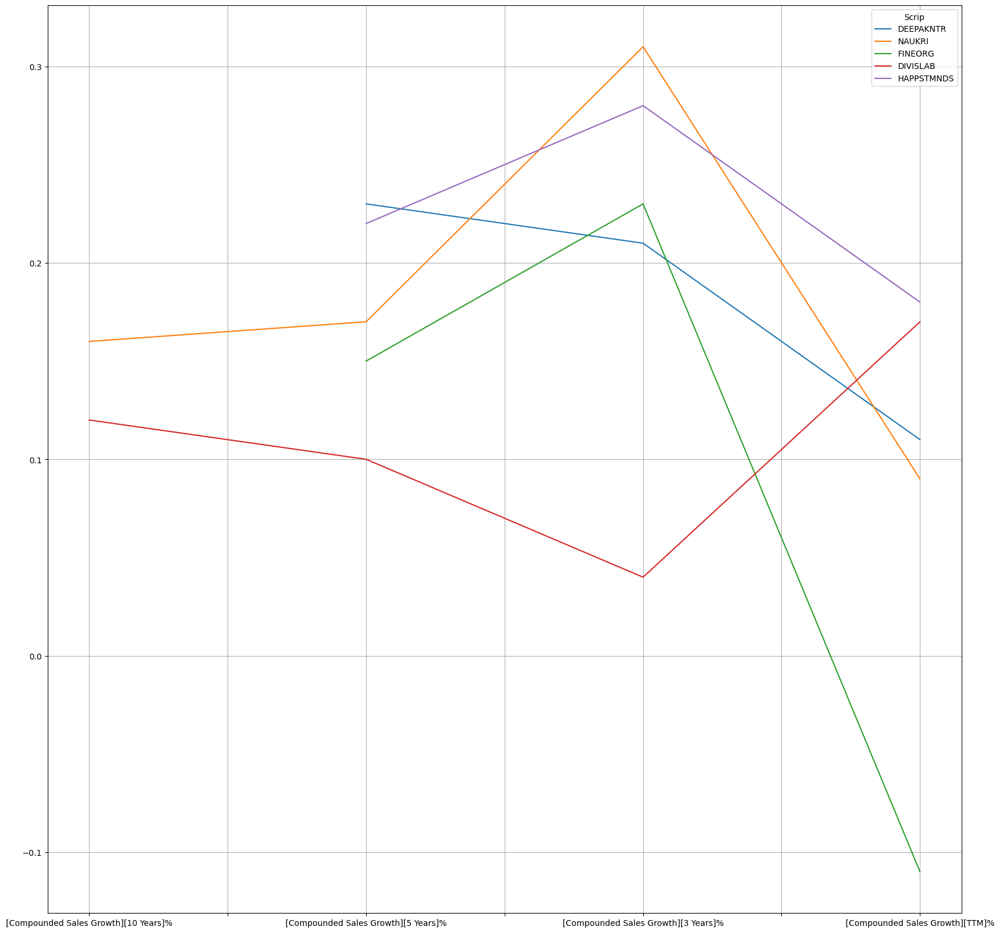

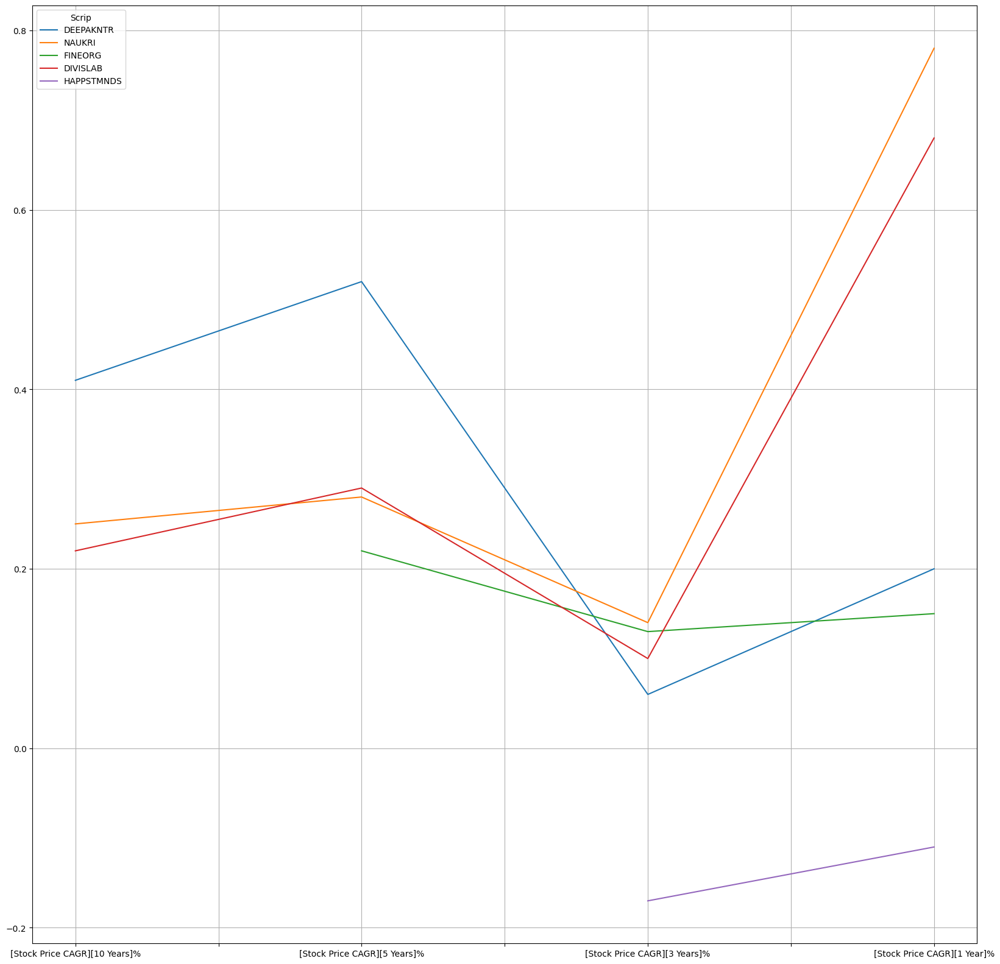

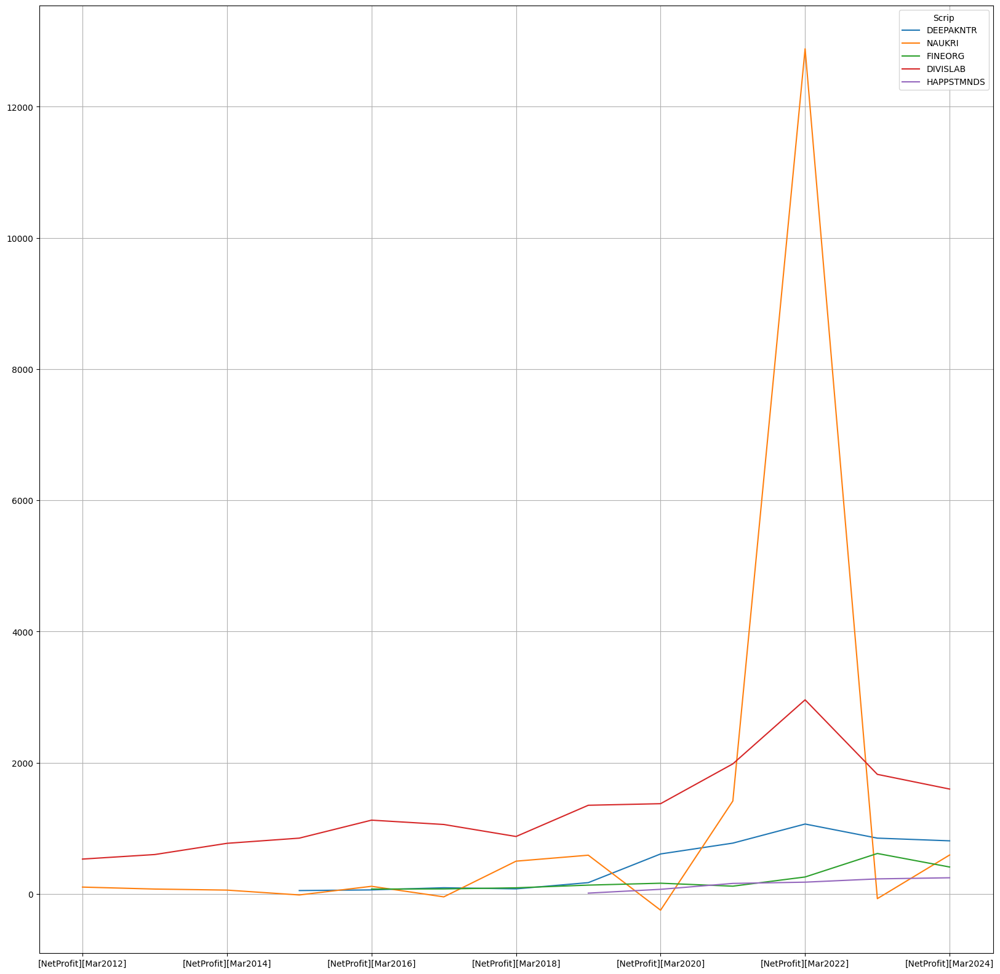

...

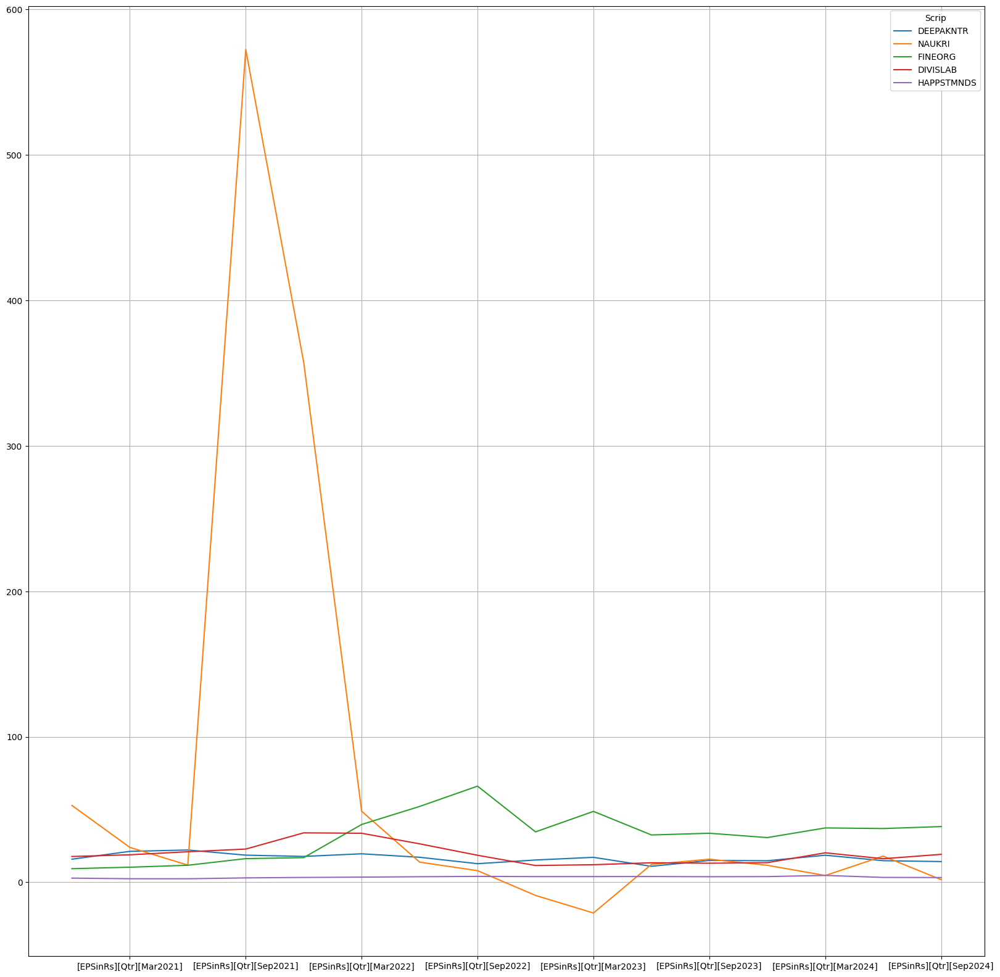

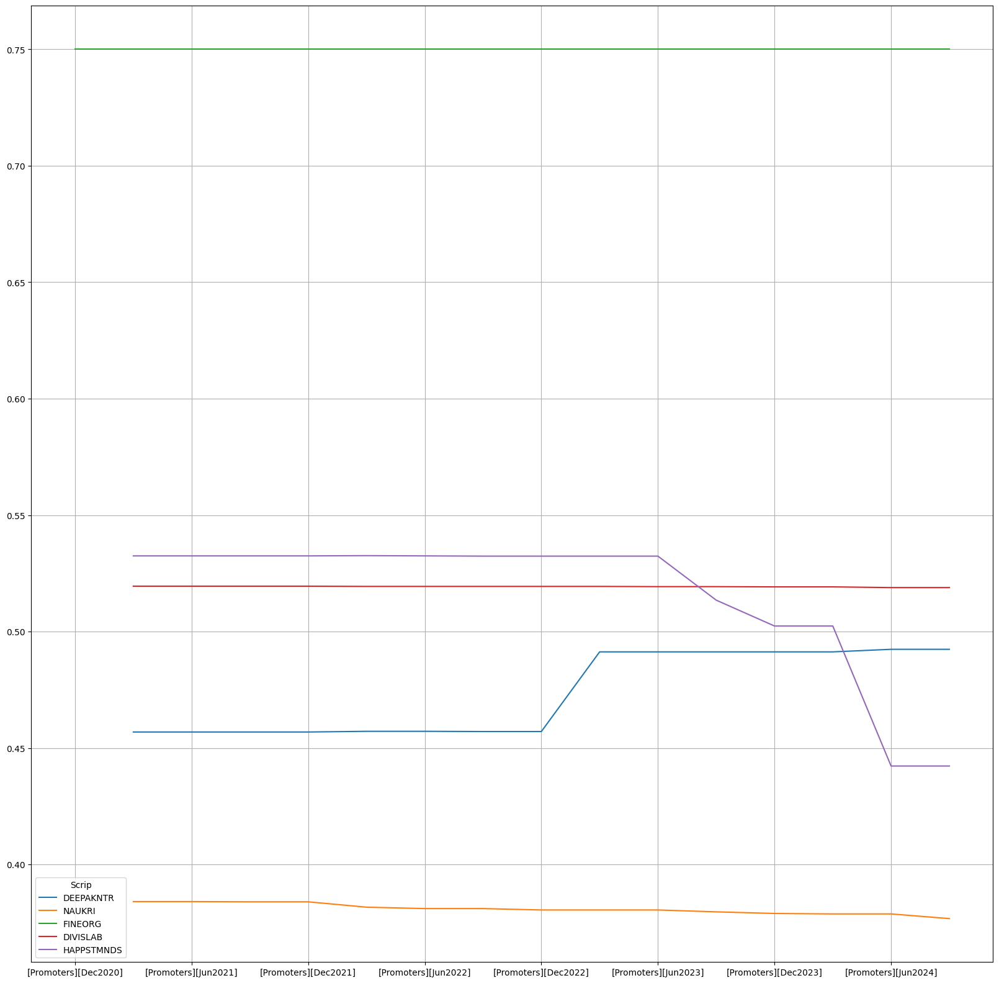

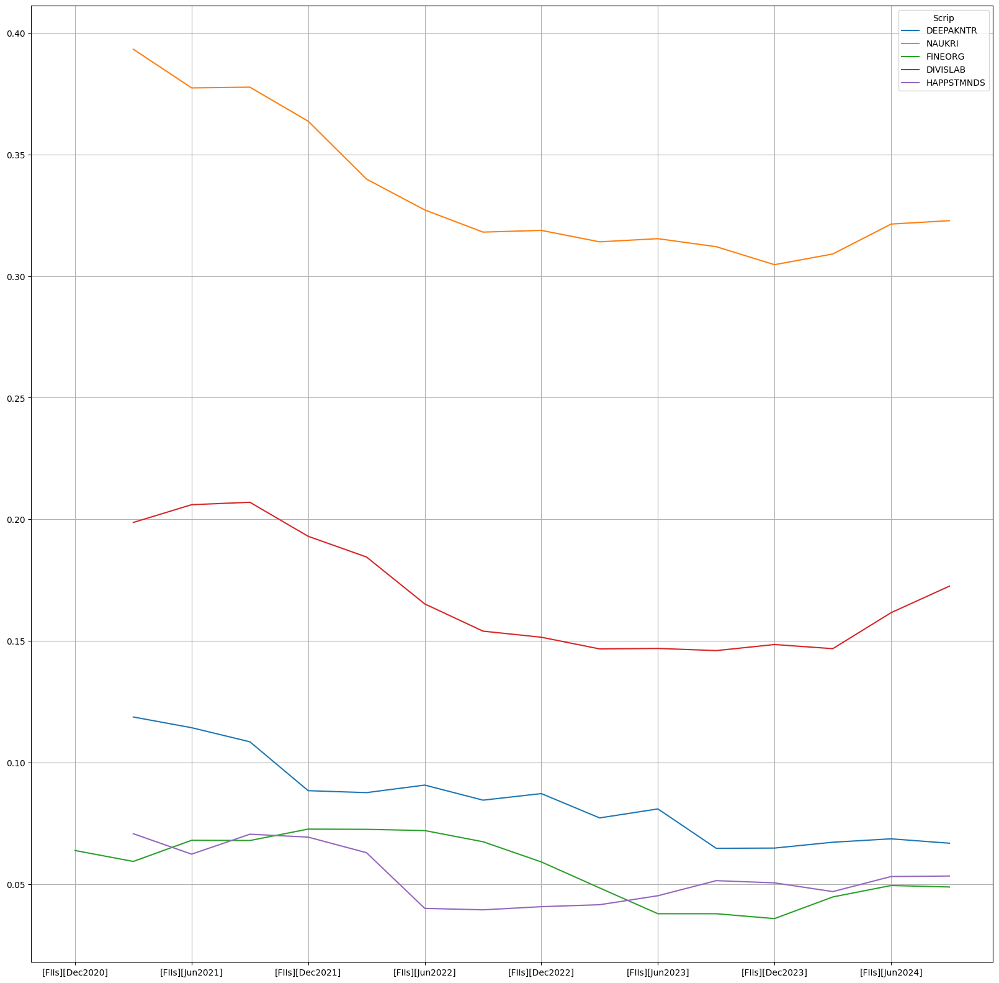

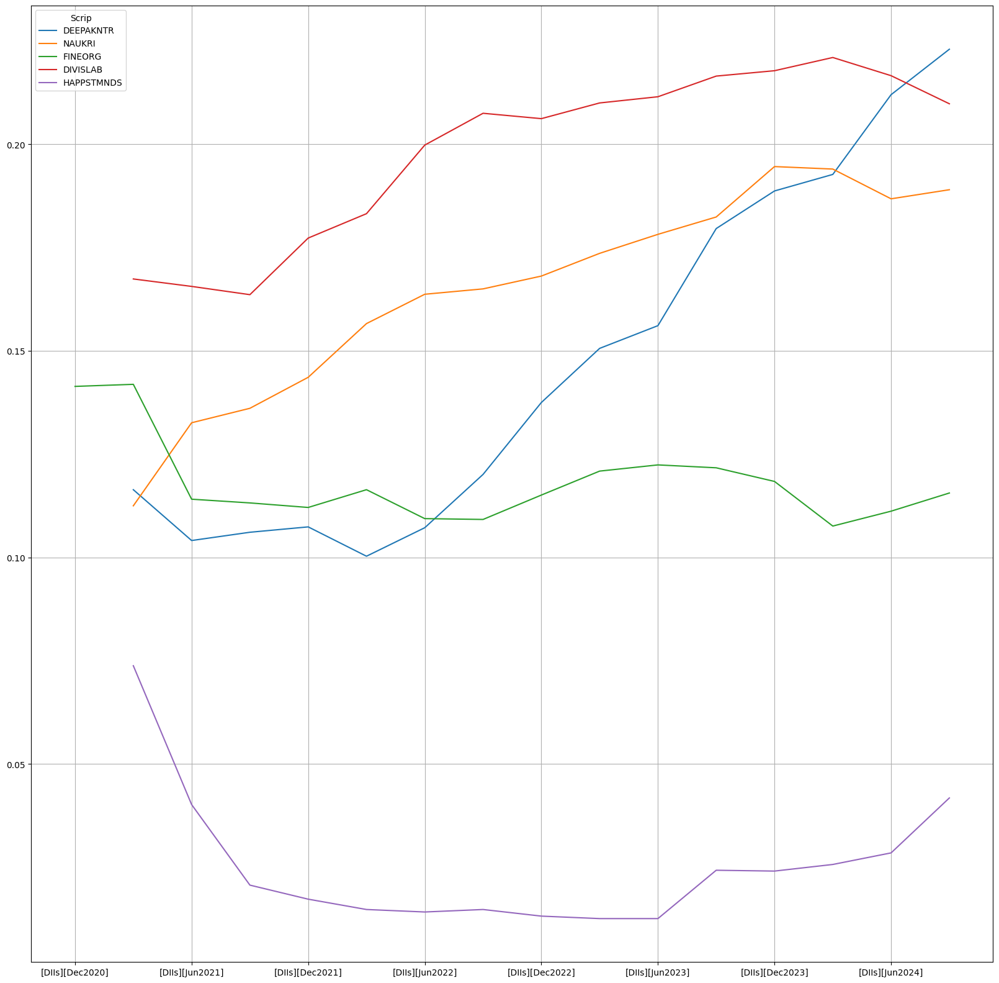

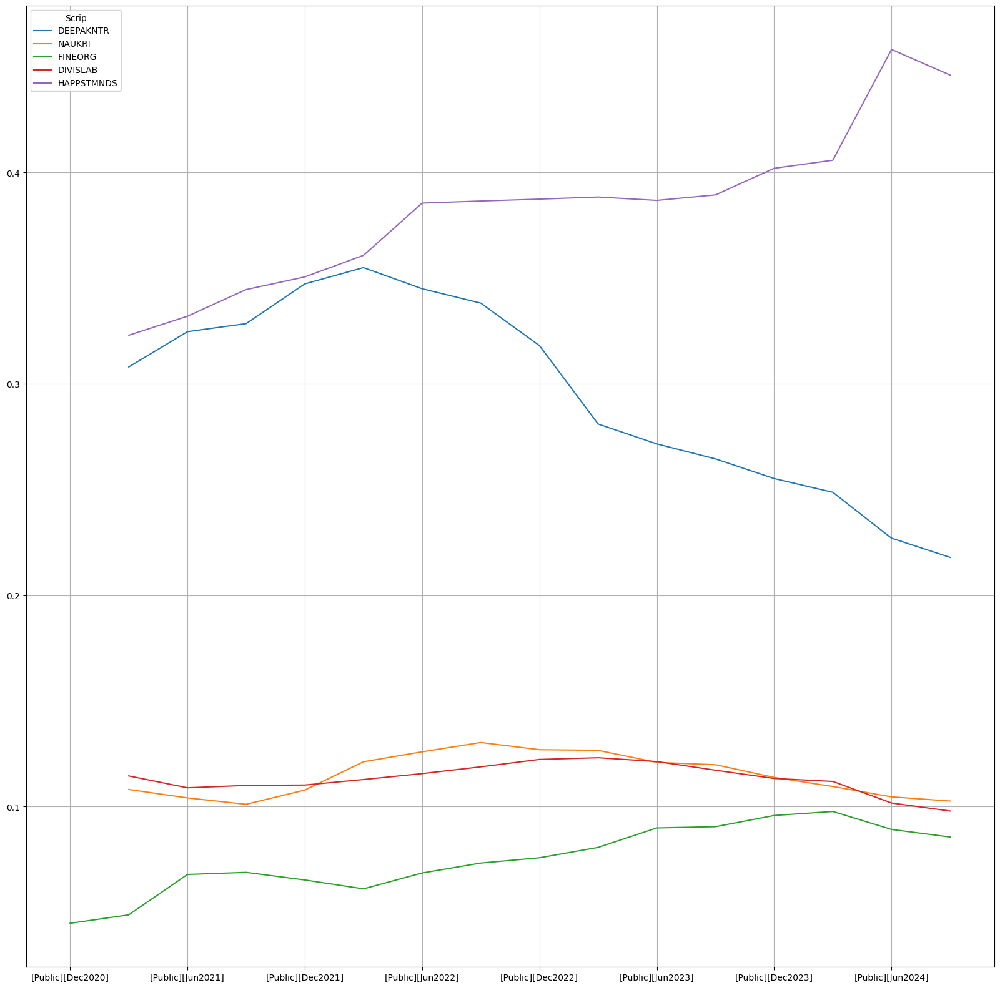

In [15]:
for attr in ATTRIBUTES:
    cols = [c for c in df.columns if re.findall(attr, c)]
    cols = sort_cols(cols)
    df[5:10][cols].T.plot(grid=True, figsize=(20,20)) # partial graph

[Public][Dec2020]       NaN
[Public][Mar2021]    0.1057
[Public][Jun2021]     0.104
[Public][Sep2021]    0.1042
[Public][Dec2021]    0.1091
[Public][Mar2022]    0.1115
[Public][Jun2022]    0.1184
[Public][Sep2022]    0.1126
[Public][Dec2022]     0.116
[Public][Mar2023]    0.1175
[Public][Jun2023]    0.1099
[Public][Sep2023]     0.105
[Public][Dec2023]    0.1017
[Public][Mar2024]    0.1019
[Public][Jun2024]    0.0983
[Public][Sep2024]    0.0936
Name: BAJFINANCE, dtype: object

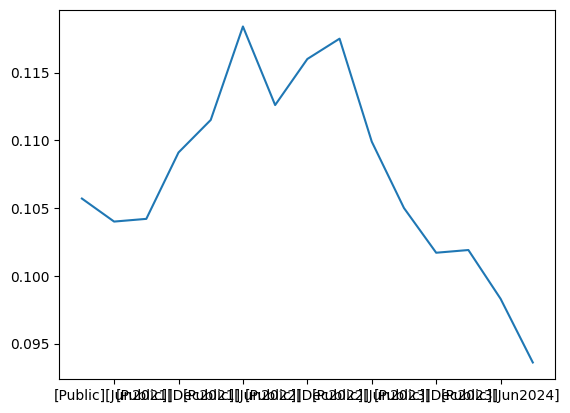

In [16]:
df.loc['BAJFINANCE'][['Market Cap', 'Current Price']]

dict(df.loc['BAJFINANCE']).keys()
df.loc['BAJFINANCE'][cols].plot()
df.loc['BAJFINANCE'][cols]